### Installing the package

Install once using the download notebook. Once the repo is public we can use the link to download from github directly.

### Packages 

Import Package

In [1]:
import pyvar as pv

In [2]:
import yfinance as yf
import pandas as pd
import numpy as np
from arch import arch_model
from itertools import product
import matplotlib.pyplot as plt
import seaborn as sns


## PT 1: Univariate Models

Start with basic VaR models. Start with Vanguard Total World Stock ETF. It's one of the most popular ETFs used as a proxy for global equity markets.

In [3]:
# Download the VT data from YF
vt_data = yf.download("VT", start="2015-01-01", end="2025-01-01")

# Check for missing values in the entire DataFrame (including the new column)
print(vt_data.isnull().sum())

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

Price   Ticker
Close   VT        0
High    VT        0
Low     VT        0
Open    VT        0
Volume  VT        0
dtype: int64


In [4]:
# Compute percentage returns and remove the first NaN
vt_data["Percent Returns"] = vt_data["Close"].pct_change()
vt_returns = vt_data["Percent Returns"].dropna()

In [5]:
vt_returns.head()

Date
2015-01-05   -0.019346
2015-01-06   -0.010034
2015-01-07    0.012884
2015-01-08    0.015095
2015-01-09   -0.006684
Name: Percent Returns, dtype: float64

General setup:

In [6]:
# Set parameters
confidence_level = 0.99 # <----- Can choose 0.95 etc

### Parametric Normal


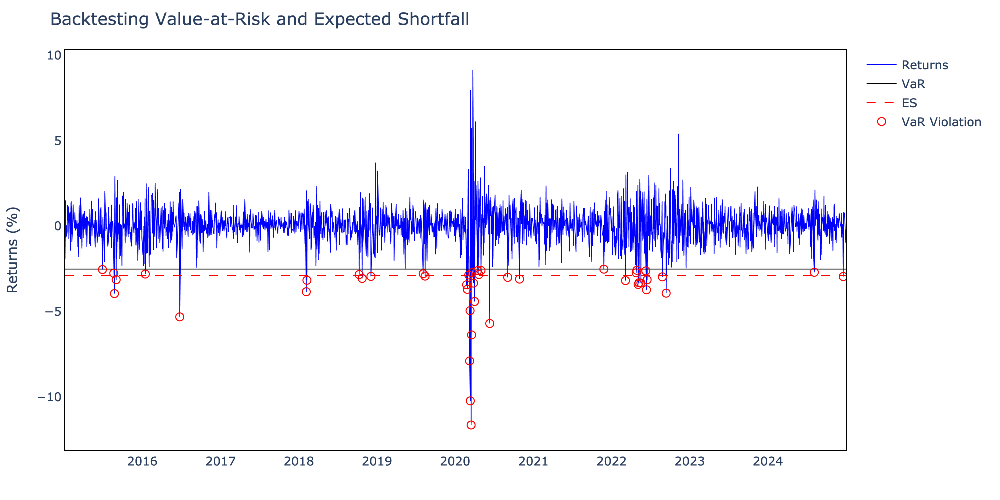

In [7]:
# Apply Parametric VaR model 
parametric_normal_results = pv.parametric_var(vt_returns, confidence_level, distribution="normal")

# Compute ES for the whole period
parametric_normal_results = pv.parametric_es(parametric_normal_results, confidence_level, distribution="normal")

# Plot backtest
plot_parametric_normal = pv.plot_backtest(parametric_normal_results, interactive=False)


In [8]:
parametric_normal_results.head()

,Returns,VaR,VaR Violation,ES
Date,,,,
2015-01-05,-0.019346,0.025147,False,0.02881
2015-01-06,-0.010034,0.025147,False,0.02881
2015-01-07,0.012884,0.025147,False,0.02881
2015-01-08,0.015095,0.025147,False,0.02881
2015-01-09,-0.006684,0.025147,False,0.02881


In [9]:
# Count violations
parametric_normal_violations, parametric_normal_violation_rate = pv.count_violations(parametric_normal_results)

# Kupiec Test (Unconditional Coverage)
parametric_normal_kupiec = pv.kupiec_test(
    total_violations=parametric_normal_violations,
    total_days=len(parametric_normal_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
parametric_normal_christoffersen = pv.christoffersen_test(parametric_normal_results)

# Joint Test (Conditional Coverage)
parametric_normal_joint = pv.joint_lr_test(
    LR_uc=parametric_normal_kupiec["LR_uc"],
    LR_c=parametric_normal_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- Parametric Normal VaR Backtesting Summary ---")
print(f"Total Violations     : {parametric_normal_violations}")
print(f"Violation Rate       : {parametric_normal_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {parametric_normal_kupiec['LR_uc']:.4f}")
print(f"p-value             : {parametric_normal_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {parametric_normal_christoffersen['LR_c']:.4f}")
print(f"p-value             : {parametric_normal_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {parametric_normal_joint['LR_total']:.4f}")
print(f"p-value             : {parametric_normal_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_joint['reject_null']}")


--- Parametric Normal VaR Backtesting Summary ---
Total Violations     : 44
Violation Rate       : 1.75%

Kupiec Test (UC):
LR_uc               : 11.6643
p-value             : 0.0006
Reject Null (5%)    : True

Christoffersen Test (Independence):
LR_c                : 3.9355
p-value             : 0.0473
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 15.5998
p-value             : 0.0004
Reject Null (5%)    : True


### Parametric Student's t


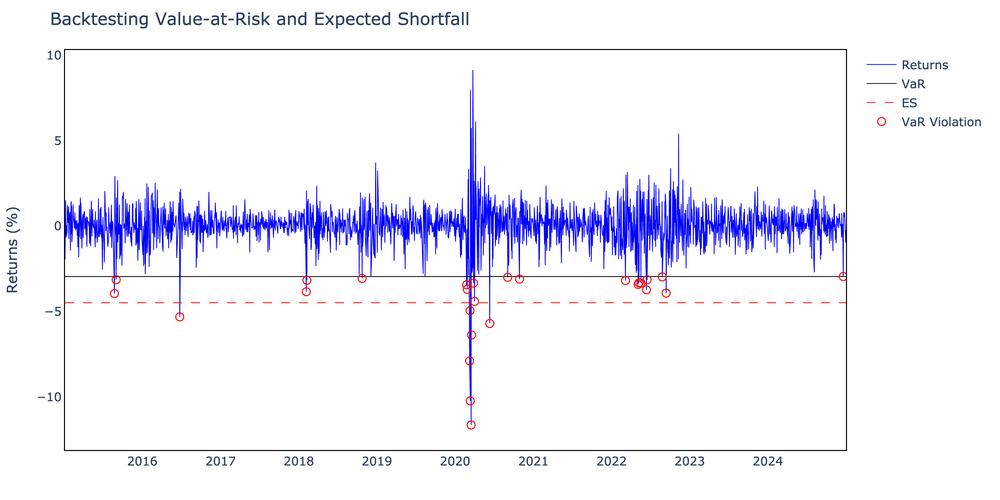

In [10]:
# Apply Parametric VaR model 
parametric_t_results = pv.parametric_var(vt_returns, confidence_level, distribution="t")

# Compute ES for the whole period
parametric_t_results = pv.parametric_es(parametric_t_results, confidence_level, distribution="t")

# Plot backtest
plot_parametric_t = pv.plot_backtest(parametric_t_results, interactive=False)


In [11]:
parametric_t_results.head()

,Returns,VaR,VaR Violation,ES
Date,,,,
2015-01-05,-0.019346,0.029483,False,0.04482
2015-01-06,-0.010034,0.029483,False,0.04482
2015-01-07,0.012884,0.029483,False,0.04482
2015-01-08,0.015095,0.029483,False,0.04482
2015-01-09,-0.006684,0.029483,False,0.04482


In [12]:
# Backtesting: Parametric t-distribution VaR

# Count violations
parametric_t_violations, parametric_t_violation_rate = pv.count_violations(parametric_t_results)

# Kupiec Test (Unconditional Coverage)
parametric_t_kupiec = pv.kupiec_test(
    total_violations=parametric_t_violations,
    total_days=len(parametric_t_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
parametric_t_christoffersen = pv.christoffersen_test(parametric_t_results)

# Joint Test (Conditional Coverage)
parametric_t_joint = pv.joint_lr_test(
    LR_uc=parametric_t_kupiec["LR_uc"],
    LR_c=parametric_t_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- Parametric t-distribution VaR Backtesting Summary ---")
print(f"Total Violations     : {parametric_t_violations}")
print(f"Violation Rate       : {parametric_t_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {parametric_t_kupiec['LR_uc']:.4f}")
print(f"p-value             : {parametric_t_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_t_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {parametric_t_christoffersen['LR_c']:.4f}")
print(f"p-value             : {parametric_t_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_t_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {parametric_t_joint['LR_total']:.4f}")
print(f"p-value             : {parametric_t_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_t_joint['reject_null']}")



--- Parametric t-distribution VaR Backtesting Summary ---
Total Violations     : 27
Violation Rate       : 1.07%

Kupiec Test (UC):
LR_uc               : 0.1342
p-value             : 0.7141
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 1.0942
p-value             : 0.2956
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 1.2284
p-value             : 0.5411
Reject Null (5%)    : False


### Historical VaR


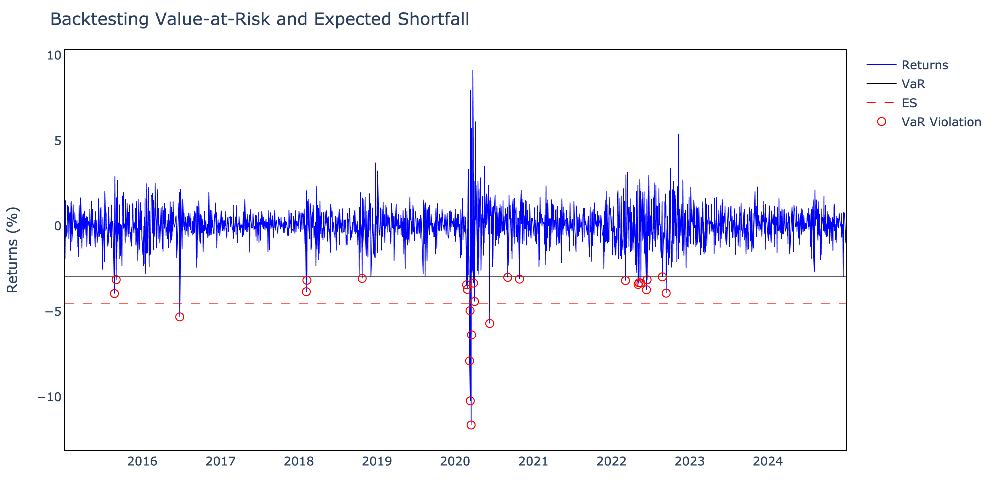

In [13]:
# Apply Parametric VaR model 
historical_results = pv.historical_var(vt_returns, confidence_level)

# Compute ES for the whole period
historical_results = pv.historical_es(historical_results, confidence_level)

# Plot backtest
plot_historical = pv.plot_backtest(historical_results, interactive=False)


In [14]:
historical_results.head()

,Returns,VaR,VaR Violation,ES,ES_monetary
Date,,,,,
2015-01-05,-0.019346,0.029661,False,0.04508,0.044629
2015-01-06,-0.010034,0.029661,False,0.04508,0.044629
2015-01-07,0.012884,0.029661,False,0.04508,0.044629
2015-01-08,0.015095,0.029661,False,0.04508,0.044629
2015-01-09,-0.006684,0.029661,False,0.04508,0.044629


In [15]:
# Count violations
historical_violations, historical_violation_rate = pv.count_violations(historical_results)

# Kupiec Test (Unconditional Coverage)
historical_kupiec = pv.kupiec_test(
    total_violations=historical_violations,
    total_days=len(historical_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
historical_christoffersen = pv.christoffersen_test(historical_results)

# Joint Test (Conditional Coverage)
historical_joint = pv.joint_lr_test(
    LR_uc=historical_kupiec["LR_uc"],
    LR_c=historical_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- Historical Simulation VaR Backtesting Summary ---")
print(f"Total Violations     : {historical_violations}")
print(f"Violation Rate       : {historical_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {historical_kupiec['LR_uc']:.4f}")
print(f"p-value             : {historical_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {historical_christoffersen['LR_c']:.4f}")
print(f"p-value             : {historical_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {historical_joint['LR_total']:.4f}")
print(f"p-value             : {historical_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_joint['reject_null']}")



--- Historical Simulation VaR Backtesting Summary ---
Total Violations     : 26
Violation Rate       : 1.03%

Kupiec Test (UC):
LR_uc               : 0.0287
p-value             : 0.8655
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 1.2068
p-value             : 0.2720
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 1.2355
p-value             : 0.5391
Reject Null (5%)    : False


### EVT


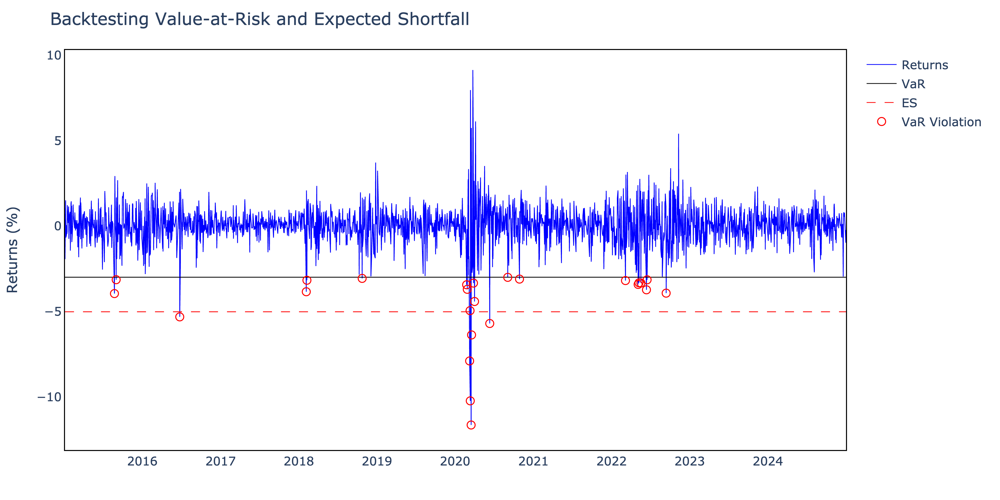

In [16]:
# Apply EVT model
evt_results = pv.evt_var(
    returns=vt_returns,
    confidence_level=confidence_level,
    threshold_percentile=99
    )

# ES
evt_results = pv.evt_es(
    result_data=evt_results,
    threshold_percentile=99
    )

# Plot backtest
plot_evt = pv.plot_backtest(evt_results, interactive=False)

In [17]:
evt_results.head()

,Returns,VaR,VaR Violation,ES
Date,,,,
2015-01-05,-0.019346,0.029905,False,0.050128
2015-01-06,-0.010034,0.029905,False,0.050128
2015-01-07,0.012884,0.029905,False,0.050128
2015-01-08,0.015095,0.029905,False,0.050128
2015-01-09,-0.006684,0.029905,False,0.050128


In [18]:
# Count violations
evt_violations, evt_violation_rate = pv.count_violations(evt_results)

# Kupiec Test (Unconditional Coverage)
evt_kupiec = pv.kupiec_test(
    total_violations=evt_violations,
    total_days=len(evt_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
evt_christoffersen = pv.christoffersen_test(evt_results)

# Joint Test (Conditional Coverage)
evt_joint = pv.joint_lr_test(
    LR_uc=evt_kupiec["LR_uc"],
    LR_c=evt_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- EVT VaR Backtesting Summary ---")
print(f"Total Violations     : {evt_violations}")
print(f"Violation Rate       : {evt_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {evt_kupiec['LR_uc']:.4f}")
print(f"p-value             : {evt_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {evt_christoffersen['LR_c']:.4f}")
print(f"p-value             : {evt_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {evt_joint['LR_total']:.4f}")
print(f"p-value             : {evt_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_joint['reject_null']}")



--- EVT VaR Backtesting Summary ---
Total Violations     : 25
Violation Rate       : 0.99%

Kupiec Test (UC):
LR_uc               : 0.0009
p-value             : 0.9760
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 1.3273
p-value             : 0.2493
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 1.3282
p-value             : 0.5147
Reject Null (5%)    : False


### Volatility Modelling

In [19]:
# Apply GARCH volatility model
garch_results, next_day_var = pv.garch_var(vt_returns, confidence_level, model="GJR", distribution="skewt")

print(f"Next-day GARCH VaR estimate (abs): {100 * next_day_var:.2f}%")

# Compute ES for the whole period
garch_results = pv.volatility_es(garch_results, confidence_level)

Next-day GARCH VaR estimate (abs): 2.98%


In [20]:
# Plot interactive VaR
fig_var = pv.plot_backtest(garch_results, subset=("2015-11-30", "2017-11-30"), interactive = True)

# Plot interactive volatility for a subset
fig_vol = pv.plot_volatility(garch_results["Volatility"], subset=("2015-11-01", "2020-11-30"), interactive=True)

Forecasting

In [21]:
steps_list = [3, 10, 20]
cumulative_list = [False, True]

print("\n--- GARCH(1,1) VaR Forecasts (99% Confidence) ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        var_estimate = pv.forecast_garch_var(
            returns=vt_returns,
            steps_ahead=steps,
            cumulative=is_cumulative,
            confidence_level=0.99
        )
        tag = "CUM" if is_cumulative else "Single"
        print(f"VaR | {steps}-day | {tag:<6}: {var_estimate * 100:.4f}%")
    except Exception as e:
        print(f"VaR | {steps}-day | {tag:<6}: ERROR → {e}")

print("\n--- GARCH(1,1) Volatility Forecasts ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        variance = pv.forecast_garch_variance(
            returns=vt_returns,
            steps_ahead=steps,
            cumulative=is_cumulative
        )
        vol_pct = np.sqrt(variance) * 100
        tag = "CUM" if is_cumulative else "Single"
        print(f"Volatility | {steps}-day | {tag:<6}: {vol_pct:.4f}%")
    except Exception as e:
        print(f"Volatility | {steps}-day | {tag:<6}: ERROR → {e}")



--- GARCH(1,1) VaR Forecasts (99% Confidence) ---
VaR | 3-day | Single: 2.8048%
VaR | 3-day | CUM   : 4.8150%
VaR | 10-day | Single: 2.8799%
VaR | 10-day | CUM   : 8.9209%
VaR | 20-day | Single: 2.9620%
VaR | 20-day | CUM   : 12.8371%

--- GARCH(1,1) Volatility Forecasts ---
Volatility | 3-day | Single: 0.9676%
Volatility | 3-day | CUM   : 1.6610%
Volatility | 10-day | Single: 0.9935%
Volatility | 10-day | CUM   : 3.0774%
Volatility | 20-day | Single: 1.0218%
Volatility | 20-day | CUM   : 4.4283%


In [22]:
# Count violations
garch_violations, garch_violation_rate = pv.count_violations(garch_results)

# Kupiec Test (Unconditional Coverage)
garch_kupiec = pv.kupiec_test(
    total_violations=garch_violations,
    total_days=len(garch_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
garch_christoffersen = pv.christoffersen_test(garch_results)

# Joint Test (Conditional Coverage)
garch_joint = pv.joint_lr_test(
    LR_uc=garch_kupiec["LR_uc"],
    LR_c=garch_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---")
print(f"Total Violations     : {garch_violations}")
print(f"Violation Rate       : {garch_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {garch_kupiec['LR_uc']:.4f}")
print(f"p-value             : {garch_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {garch_christoffersen['LR_c']:.4f}")
print(f"p-value             : {garch_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {garch_joint['LR_total']:.4f}")
print(f"p-value             : {garch_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_joint['reject_null']}")



--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---
Total Violations     : 26
Violation Rate       : 1.03%

Kupiec Test (UC):
LR_uc               : 0.0287
p-value             : 0.8655
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 1.2068
p-value             : 0.2720
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 1.2355
p-value             : 0.5391
Reject Null (5%)    : False


## PT 2: Portfolio Models

Highly diversified global equity strategy: long global, regional, and sector ETFs (VT, VGK, EWJ, VWO, SPY) and stable leaders in tech, healthcare, and consumer sectors (AAPL, JNJ, PG, UNH, NVS); small short in industrials (XLI) as a cyclical hedge. Portfolio valued in CHF.

In [23]:
# Define shares — globally diversified portfolio
shares = pd.Series({
    "VT": 120,     # Global equity ETF
    "SPY": 80,     # US large-cap ETF
    "VGK": 60,     # Europe ETF
    "EWJ": 40,     # Japan ETF
    "VWO": 40,     # Emerging Markets ETF
    "AAPL": 50,    # Apple — tech
    "JNJ": 50,     # Johnson & Johnson — healthcare
    "PG": 40,      # Procter & Gamble — consumer staples
    "UNH": 40,     # UnitedHealth — healthcare
    "NVS": 30,     # Novartis — Swiss healthcare
    "XLI": -30     # US industrials sector ETF — short hedge
})

# Download prices and convert to base currency
tickers = shares.index.tolist()
raw_prices = pv.get_raw_prices(tickers, start="2020-01-01", end="2025-01-01")
prices_chf = pv.convert_to_base(raw_prices, base_currency="CHF")

# Compute monetary position values over time
portfolio_matrix = pv.create_portfolio(prices_chf, shares)

# Compute portfolio returns and statistics
portfolio_returns, average_returns, vcv_matrix = pv.summary_statistics(portfolio_matrix)

# Compute latest portfolio value and weights
latest_prices = prices_chf.iloc[-1]
portfolio_value_chf = (shares * latest_prices).sum()
weights = (shares * latest_prices) / portfolio_value_chf

[currency detection] AAPL: USD
[currency detection] EWJ: USD
[currency detection] JNJ: USD
[currency detection] NVS: USD
[currency detection] PG: USD
[currency detection] SPY: USD
[currency detection] UNH: USD
[currency detection] VGK: USD
[currency detection] VT: USD
[currency detection] VWO: USD
[currency detection] XLI: USD
[fx download] Downloading FX pairs: CHFUSD=X
[conversion] AAPL: USD → CHF via CHFUSD=X
[conversion] EWJ: USD → CHF via CHFUSD=X
[conversion] JNJ: USD → CHF via CHFUSD=X
[conversion] NVS: USD → CHF via CHFUSD=X
[conversion] PG: USD → CHF via CHFUSD=X
[conversion] SPY: USD → CHF via CHFUSD=X
[conversion] UNH: USD → CHF via CHFUSD=X
[conversion] VGK: USD → CHF via CHFUSD=X
[conversion] VT: USD → CHF via CHFUSD=X
[conversion] VWO: USD → CHF via CHFUSD=X
[conversion] XLI: USD → CHF via CHFUSD=X


In [24]:
# Print final portfolio value and weights
print(f"\nFinal portfolio value in CHF: {portfolio_value_chf:,.2f}\n")
print("Portfolio weights (based on latest prices):")
print(weights.round(4).sort_values(ascending=False))


Final portfolio value in CHF: 103,280.79

Portfolio weights (based on latest prices):
SPY     0.4088
UNH     0.1762
VT      0.1229
AAPL    0.1092
JNJ     0.0627
PG      0.0579
VGK     0.0332
NVS     0.0246
EWJ     0.0235
VWO     0.0154
XLI    -0.0345
dtype: float64



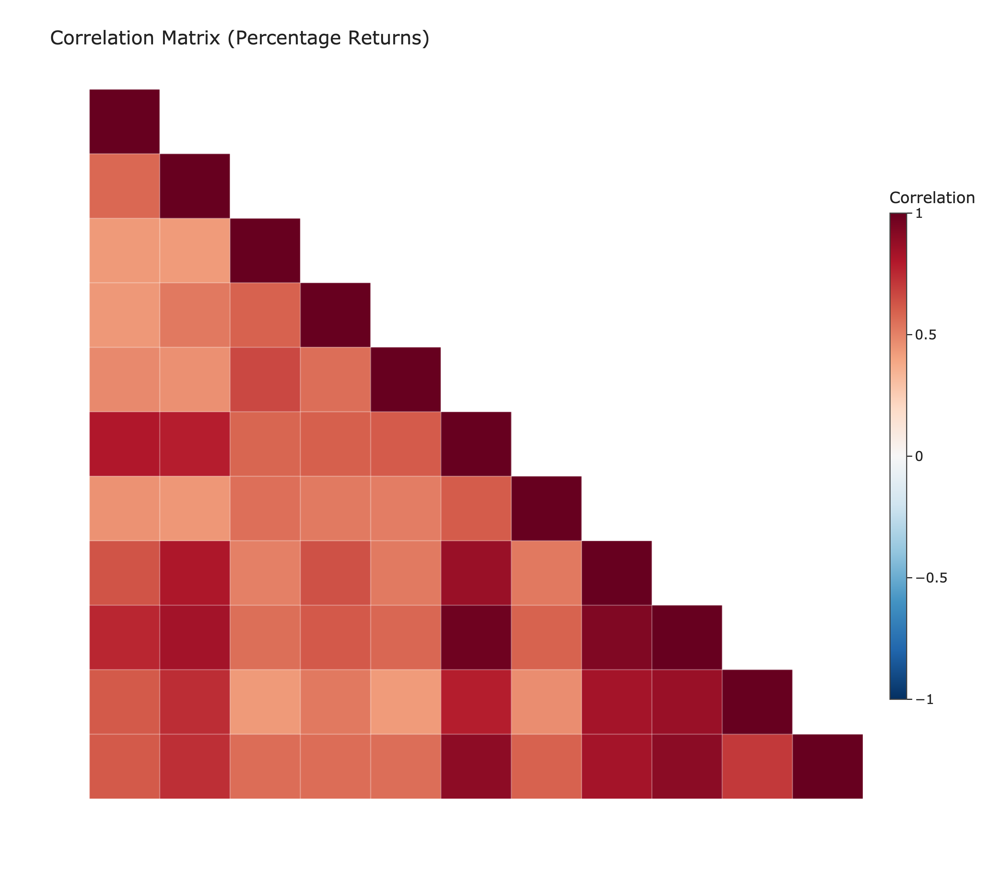

In [25]:
pv.plot_correlation_matrix(portfolio_matrix, interactive=False)

### Portfolio Metrics

In [26]:
# Compute and display the AN VaR
asset_normal_results = pv.asset_normal_var(position_data=portfolio_matrix,
                                 confidence_level=confidence_level)

In [27]:
asset_normal_results.head(-4)

,Diversified_VaR,Undiversified_VaR,Diversification_Benefit
Date,,,
2020-01-03,1872.019446,2207.399118,335.379672
2020-01-06,1880.609405,2217.499262,336.889857
2020-01-07,1868.643546,2203.396090,334.752544
2020-01-08,1884.586053,2222.711096,338.125043
2020-01-09,1902.087486,2242.994081,340.906596
...,...,...,...
2024-12-18,3169.420745,3704.434796,535.014051
2024-12-19,3190.980748,3727.722826,536.742078
2024-12-20,3221.026832,3762.716169,541.689337



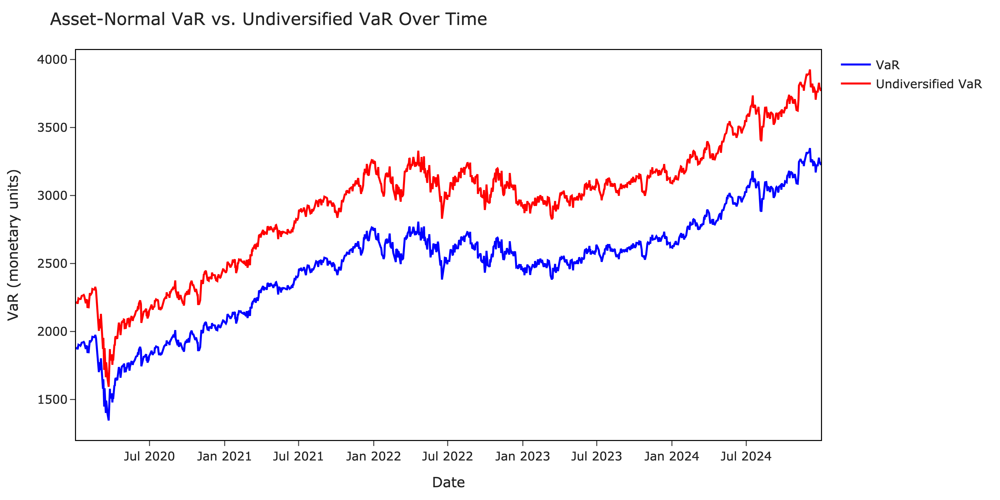

In [28]:
pv.plot_var_series(asset_normal_results, interactive=False)

In [29]:
# Compute and display Component VaR (styled table)
component_df = pv.component_var(
    position_data=portfolio_matrix,
    confidence_level=confidence_level
)

In [30]:
component_df.head()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2020-01-03,131.805456,49.573688,130.655329,48.605601,95.118419,736.885999,363.157990,86.346998,260.133790,39.524110,-69.787936
2020-01-06,132.906695,49.758753,130.475175,48.943737,95.250048,739.885776,365.911531,86.690262,261.158017,39.460440,-69.831029
2020-01-07,131.875863,49.696178,130.940278,48.304809,94.375185,735.580889,362.451374,86.000264,259.571643,39.324931,-69.477868
2020-01-08,134.020533,49.677554,130.907774,48.300266,94.771510,739.429362,370.937776,86.188793,260.573215,39.487478,-69.708207
2020-01-09,137.662057,50.279852,131.831901,48.651862,96.255706,748.173617,369.826647,86.694957,263.153789,39.886975,-70.329878



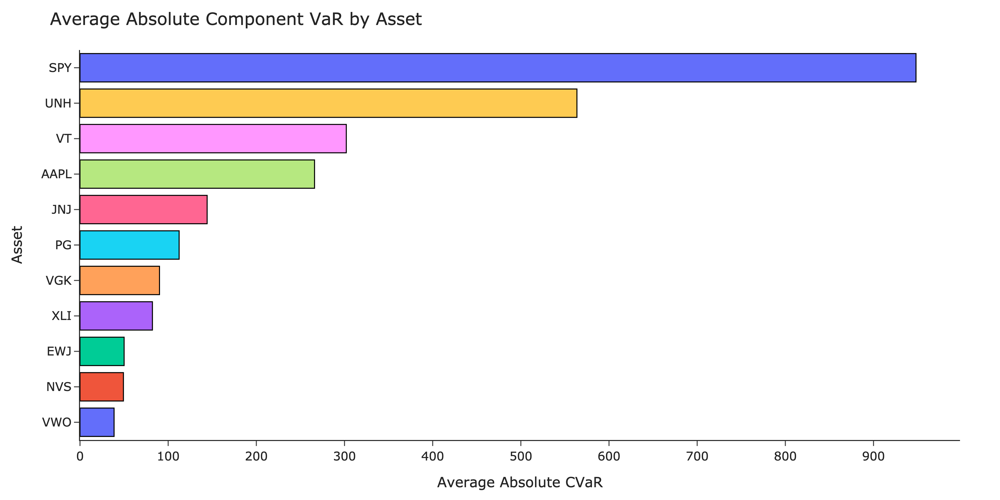

In [31]:
pv.plot_risk_contribution_bar(component_df, interactive=False)


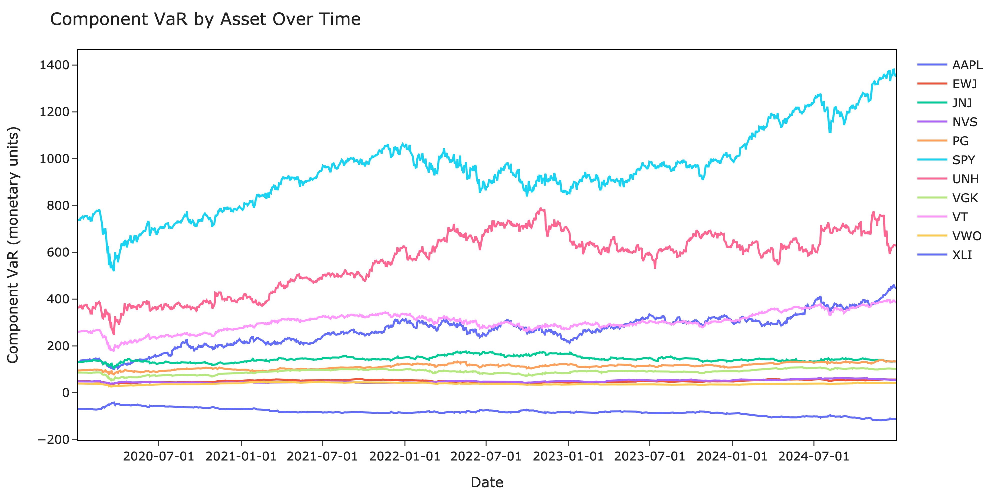

In [32]:
pv.plot_risk_contribution_lines(component_df, interactive=False)

In [33]:
# Define change in position
change_vector = [0,10_000_000,0,0,0,0,0,0,0,0,0] # 10M CHF in SPY

# Compute and display Incremental VaR
ivar_series = pv.incremental_var(
    position_data=portfolio_matrix,
    change_vector=change_vector,
    confidence_level=confidence_level
)

In [34]:
ivar_series

Date
2020-01-03    235339.738666
2020-01-06    235315.511812
2020-01-07    235346.556760
2020-01-08    235138.736993
2020-01-09    235260.789053
                  ...      
2024-12-24    232752.660274
2024-12-26    232674.043993
2024-12-27    232655.800334
2024-12-30    232612.290549
2024-12-31    232617.417443
Length: 1257, dtype: float64

### Time Varying Correlation Models

In [35]:
# Run RiskMetrics Correlation VaR
result_ewma_correlation = pv.ewma_correlation_var(portfolio_matrix, distribution="normal")

# ES RiskMetrics
result_ewma_correlation = pv.correlation_es(result_ewma_correlation)

In [36]:
result_ewma_correlation.head(-4)

,Returns,Volatility,VaR,VaR Monetary,VaR Violation,ES,ES Monetary
2020-01-03,-0.005448,0.012613,0.029343,1825.235523,False,0.033617,2091.107579
2020-01-06,0.004278,0.012277,0.028562,1784.243816,False,0.032722,2044.144835
2020-01-07,-0.006072,0.011993,0.027899,1732.259548,False,0.031963,1984.588303
2020-01-08,0.007745,0.011791,0.027430,1716.225038,False,0.031426,1966.218134
2020-01-09,0.009379,0.011659,0.027123,1712.859753,False,0.031074,1962.362647
...,...,...,...,...,...,...,...
2024-12-18,-0.017217,0.008254,0.019201,1950.569267,False,0.021998,2234.698003
2024-12-19,0.006921,0.008161,0.018985,1941.747245,False,0.021750,2224.590925
2024-12-20,0.008460,0.008192,0.019058,1965.607509,False,0.021834,2251.926783
2024-12-23,0.000021,0.007949,0.018493,1907.338048,False,0.021186,2185.169530



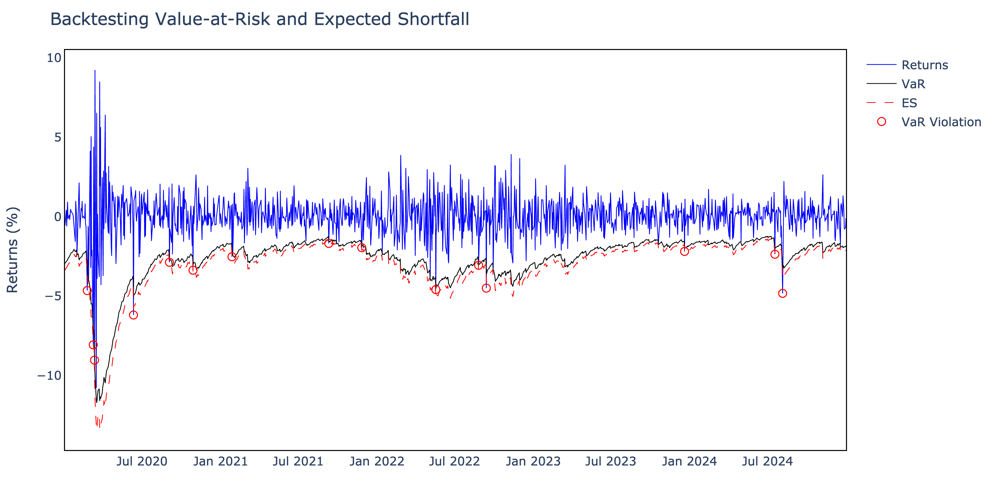

In [37]:
# Plot RiskMetrics model results
fig_rm_es = pv.plot_backtest(result_ewma_correlation, interactive=False)

In [38]:
# Count violations
ewma_corr_violations, ewma_corr_violation_rate = pv.count_violations(result_ewma_correlation)

# Kupiec Test (Unconditional Coverage)
ewma_corr_kupiec = pv.kupiec_test(
    total_violations=ewma_corr_violations,
    total_days=len(result_ewma_correlation),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
ewma_corr_christoffersen = pv.christoffersen_test(result_ewma_correlation)

# Joint Test (Conditional Coverage)
ewma_corr_joint = pv.joint_lr_test(
    LR_uc=ewma_corr_kupiec["LR_uc"],
    LR_c=ewma_corr_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- RiskMetrics Correlation VaR Backtesting Summary ---")
print(f"Total Violations     : {ewma_corr_violations}")
print(f"Violation Rate       : {ewma_corr_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {ewma_corr_kupiec['LR_uc']:.4f}")
print(f"p-value             : {ewma_corr_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {ewma_corr_christoffersen['LR_c']:.4f}")
print(f"p-value             : {ewma_corr_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {ewma_corr_joint['LR_total']:.4f}")
print(f"p-value             : {ewma_corr_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_joint['reject_null']}")



--- RiskMetrics Correlation VaR Backtesting Summary ---
Total Violations     : 15
Violation Rate       : 1.19%

Kupiec Test (UC):
LR_uc               : 0.4469
p-value             : 0.5038
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 0.3626
p-value             : 0.5471
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 0.8095
p-value             : 0.6671
Reject Null (5%)    : False


### Factor Models

We do the single factor model. SMI is used as benchmark.

In [39]:
# Download SMI index prices (already in CHF)
smi_data = yf.download("^SSMI", start="2019-12-30", end="2025-01-01")["Close"]

# Ensure Series (in case yfinance returns a DataFrame)
if isinstance(smi_data, pd.DataFrame):
    smi_data = smi_data.squeeze()

# Compute benchmark returns
benchmark = smi_data.pct_change().dropna()

# Align benchmark with asset returns
benchmark = benchmark.reindex(portfolio_returns.index).ffill()

[*********************100%***********************]  1 of 1 completed


In [40]:
benchmark.head()

Date
2020-01-03    0.007806
2020-01-06   -0.003216
2020-01-07    0.002006
2020-01-08   -0.003241
2020-01-09   -0.000112
Name: ^SSMI, dtype: float64

In [41]:
print("Benchmark type:", type(benchmark))
print("Benchmark ndim:", benchmark.ndim)
print("Benchmark shape:", benchmark.shape)
print("Portfolio returns shape:", portfolio_returns.shape)
print("Index equal:", benchmark.index.equals(portfolio_returns.index))
print("Any NaNs in benchmark:", benchmark.isna().any())


Benchmark type: <class 'pandas.core.series.Series'>
Benchmark ndim: 1
Benchmark shape: (1257,)
Portfolio returns shape: (1257, 11)
Index equal: True
Any NaNs in benchmark: False


In [42]:
results_one_factor_df, portfolio_volatility = pv.single_factor_var(
    returns=portfolio_returns,
    benchmark=benchmark,
    weights=weights,
    portfolio_value=103_280,
    confidence_level=confidence_level
)

results_one_factor_df = pv.factor_models_es(
    result_data= results_one_factor_df,
    portfolio_volatility=portfolio_volatility,
    confidence_level = confidence_level
)


In [43]:
results_one_factor_df.head()

,Returns,Benchmark,VaR,VaR Violation,VaR_monetary,ES,ES_monetary
Date,,,,,,,
2020-01-03,-0.005302,0.007806,0.031218,False,3224.150451,0.035765,3693.794779
2020-01-06,0.004734,-0.003216,0.031218,False,3224.150451,0.035765,3693.794779
2020-01-07,-0.006443,0.002006,0.031218,False,3224.150451,0.035765,3693.794779
2020-01-08,0.008775,-0.003241,0.031218,False,3224.150451,0.035765,3693.794779
2020-01-09,0.010260,-0.000112,0.031218,False,3224.150451,0.035765,3693.794779



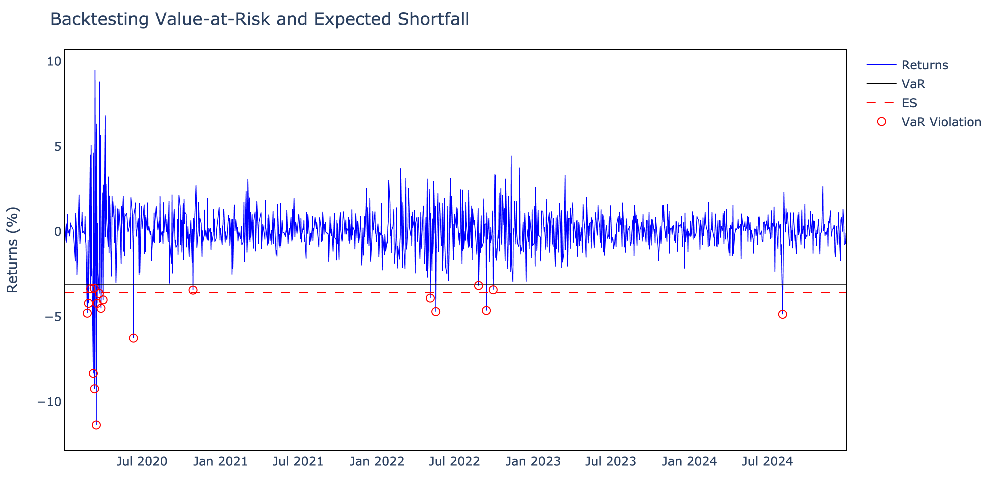

In [44]:
# Plot backtest
fig_var = pv.plot_backtest(results_one_factor_df, interactive=False)

In [45]:
# Count violations
sf_violations, sf_violation_rate = pv.count_violations(results_one_factor_df)

# Kupiec Test (Unconditional Coverage)
sf_kupiec = pv.kupiec_test(
    total_violations=sf_violations,
    total_days=len(results_one_factor_df),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
sf_christoffersen = pv.christoffersen_test(results_one_factor_df)

# Joint Test (Conditional Coverage)
sf_joint = pv.joint_lr_test(
    LR_uc=sf_kupiec["LR_uc"],
    LR_c=sf_christoffersen["LR_c"]
)

# Summary output
print(f"\n--- Single-Factor VaR Backtesting Summary ---")
print(f"Total Violations     : {sf_violations}")
print(f"Violation Rate       : {sf_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {sf_kupiec['LR_uc']:.4f}")
print(f"p-value             : {sf_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {sf_christoffersen['LR_c']:.4f}")
print(f"p-value             : {sf_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {sf_joint['LR_total']:.4f}")
print(f"p-value             : {sf_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_joint['reject_null']}")



--- Single-Factor VaR Backtesting Summary ---
Total Violations     : 19
Violation Rate       : 1.51%

Kupiec Test (UC):
LR_uc               : 2.8721
p-value             : 0.0901
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 1.1238
p-value             : 0.2891
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 3.9959
p-value             : 0.1356
Reject Null (5%)    : False


### Simulations

Start by defining options.

In [46]:
# Use existing spot prices and volatilities
S0 = prices_chf.iloc[-1]
volatility_annualized = portfolio_returns.std() * np.sqrt(252)

# Select representative tickers for options
selected_tickers = ["VT", "SPY", "AAPL", "JNJ", "XLI"]

# Create example option contracts
options = [
    {
        "asset_index": tickers.index("AAPL"),
        "K": 200,
        "T": 60 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["AAPL"],
        "type": "call",
        "qty": 30
    },
    {
        "asset_index": tickers.index("XLI"),
        "K": 90,
        "T": 45 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["XLI"],
        "type": "put",
        "qty": 50
    },
    {
        "asset_index": tickers.index("VT"),
        "K": 100,
        "T": 90 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["VT"],
        "type": "call",
        "qty": 25
    }
]

# Print values of equity positions (already defined)
print("\nEquity Positions (latest prices):")
total_equity_value = 0
for tkr in tickers:
    position_value = shares[tkr] * S0[tkr]
    print(f"{tkr:5}: {shares[tkr]:4} × {S0[tkr]:.2f} = {position_value:,.2f} CHF")
    total_equity_value += position_value

# Price and print values of options
print("\nOption Values (Black-Scholes at time 0):")
total_option_value = 0
for i, opt in enumerate(options):
    spot = S0[tickers[opt["asset_index"]]]
    price_bs = pv.black_scholes(
        spot, opt["K"], opt["T"], opt["r"], opt["sigma"], opt["type"]
    )
    value = price_bs * opt["qty"]
    print(f"Option {i+1} on {tickers[opt['asset_index']]} ({opt['type']}): "
          f"BS = {price_bs:.2f} × {opt['qty']} = {value:,.2f} CHF")
    total_option_value += value

# Print new portfolio value
total_portfolio_value = total_equity_value + total_option_value
print(f"\nTotal equity value:     {total_equity_value:,.2f} CHF")
print(f"Total option value:     {total_option_value:,.2f} CHF")
print(f"Total portfolio value:  {total_portfolio_value:,.2f} CHF")



Equity Positions (latest prices):
VT   :  120 × 105.77 = 12,692.06 CHF
SPY  :   80 × 527.78 = 42,222.66 CHF
VGK  :   60 × 57.10 = 3,425.81 CHF
EWJ  :   40 × 60.61 = 2,424.30 CHF
VWO  :   40 × 39.74 = 1,589.53 CHF
AAPL :   50 × 225.65 = 11,282.25 CHF
JNJ  :   50 × 129.59 = 6,479.46 CHF
PG   :   40 × 149.58 = 5,983.12 CHF
UNH  :   40 × 454.97 = 18,198.74 CHF
NVS  :   30 × 84.74 = 2,542.25 CHF
XLI  :  -30 × 118.65 = -3,559.39 CHF

Option Values (Black-Scholes at time 0):
Option 1 on AAPL (call): BS = 30.43 × 30 = 912.95 CHF
Option 2 on XLI (put): BS = 0.01 × 50 = 0.65 CHF
Option 3 on VT (call): BS = 8.99 × 25 = 224.70 CHF

Total equity value:     103,280.79 CHF
Total option value:     1,138.29 CHF
Total portfolio value:  104,419.09 CHF


Monte Carlo.

In [47]:
# Run Parametric Monte Carlo VaR and ES (1-day, 99% level)
var_mc, pnl_mc = pv.monte_carlo_var(
    price_data=prices_chf,  # ensure correct order
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=10_000,
    seed=1
)

es_mc = pv.simulation_es(var_mc, pnl_mc)

# Display Monte Carlo Results
print(f"Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_mc:,.2f} CHF")
print(f"Monte Carlo ES ({int(confidence_level * 100)}%):  {es_mc:,.2f} CHF")

Monte Carlo VaR (99%):  3,966.25 CHF
Monte Carlo ES (99%):  4,482.88 CHF



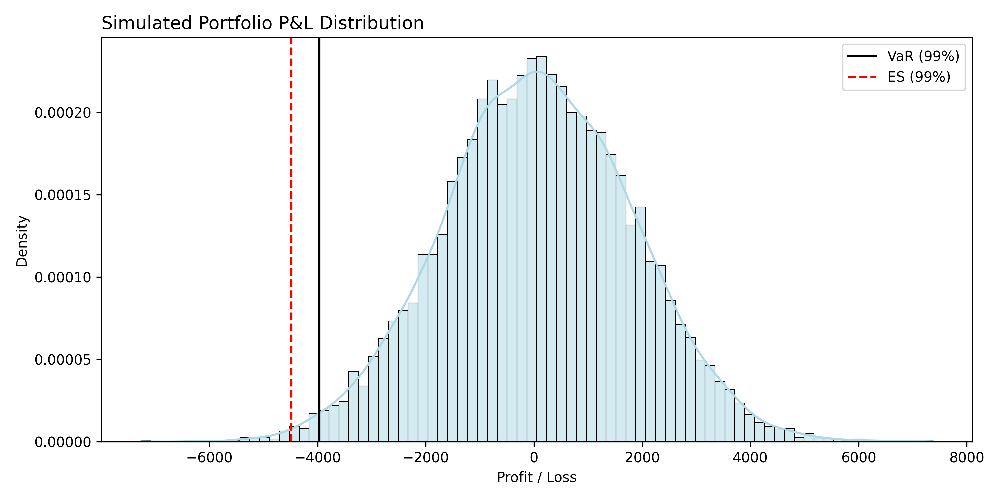

In [ ]:
pv.plot_simulated_distribution(
    profit_and_loss=pnl_mc,
    var=var_mc,
    es=es_mc,
    confidence_level=0.99
)


Multiday Monte Carlo.

In [49]:
# Run the simulation
var_mc20, pnl_mc20, portfolio_paths = pv.multiday_monte_carlo_var(
    price_data=prices_chf,  # ensure correct order
    shares=shares.values, # RIGID LOGIC FOR THE simulations.py
    confidence_level=confidence_level,
    days_ahead=20,
)

es_mc = pv.simulation_es(var_mc20, pnl_mc20)

# Print results
print(f"Monte Carlo 20-day VaR (99%):  {var_mc20:,.2f} CHF")
print(f"Monte Carlo 20-day ES  (99%):  {es_mc:,.2f} CHF")


Monte Carlo 20-day VaR (99%):  12,850.34 CHF
Monte Carlo 20-day ES  (99%):  14,734.05 CHF



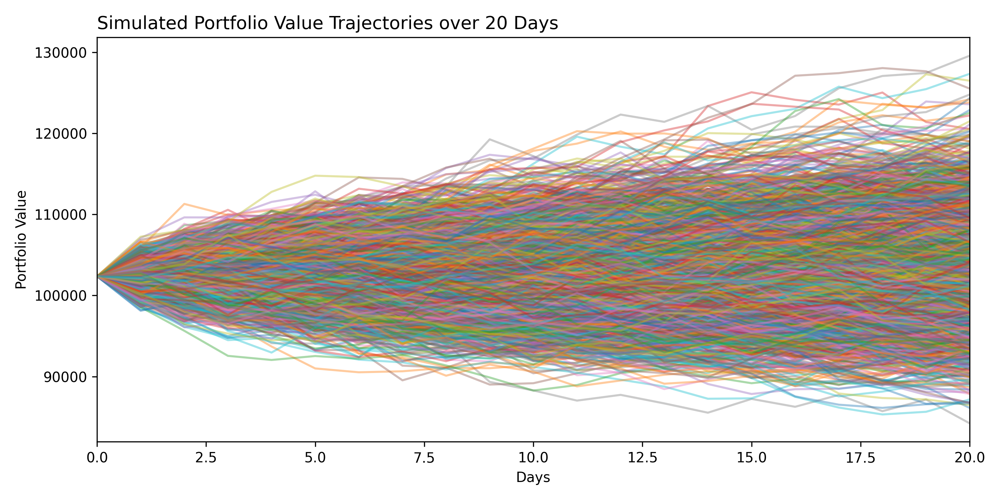

In [50]:
pv.plot_simulated_paths(portfolio_paths)

Historical Simulations, with no replacement.

In [51]:
# Run historical simulation (1-day horizon, 99% confidence)
var_hist, pnl_hist = pv.historical_simulation_var(
    price_data=prices_chf,
    shares=shares.values,
    options=options,
    confidence_level=0.99,
)

es_hist = pv.simulation_es(var_hist, pnl_hist)

# Display results
print(f"Historical Simulation VaR (99%):   {var_hist:,.2f} CHF")
print(f"Historical Simulation ES  (99%):   {es_hist:,.2f} CHF")


Historical Simulation VaR (99%):   4,718.24 CHF
Historical Simulation ES  (99%):   7,309.01 CHF



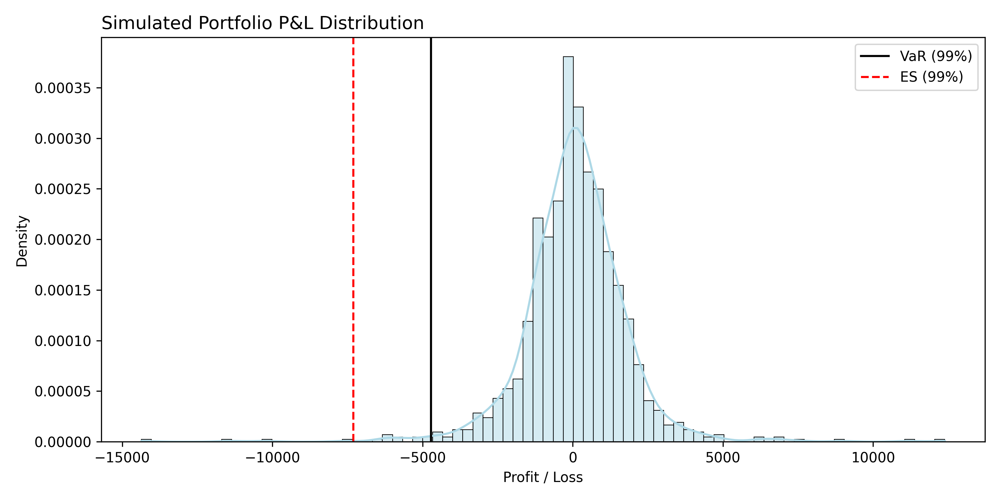

In [52]:
pv.plot_simulated_distribution(
    profit_and_loss=pnl_hist,
    var=var_hist,
    es=es_hist,
    confidence_level=0.99
)

Comparison.

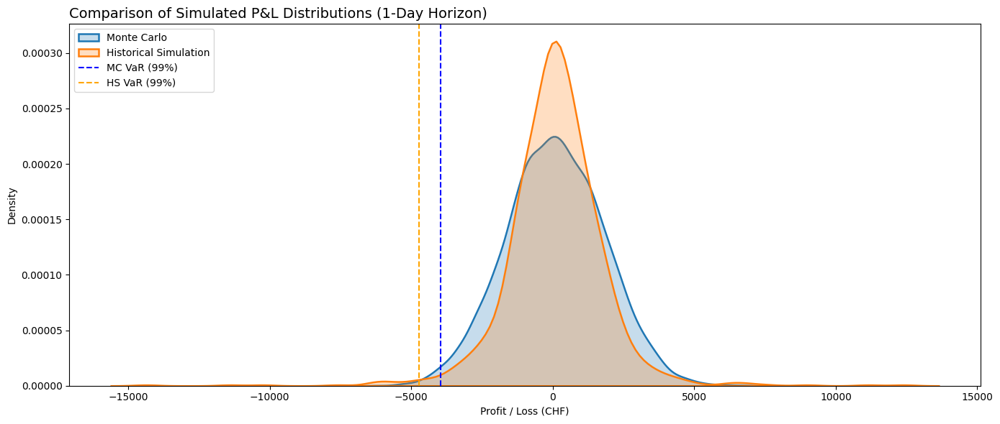

In [53]:
# Larger figure
plt.figure(figsize=(14, 6))

# KDE plots
sns.kdeplot(pnl_mc, label="Monte Carlo", fill=True, color="tab:blue", linewidth=1.8)
sns.kdeplot(pnl_hist, label="Historical Simulation", fill=True, color="tab:orange", linewidth=1.8)

# VaR markers
plt.axvline(-var_mc, color="blue", linestyle="--", linewidth=1.5, label="MC VaR (99%)")
plt.axvline(-var_hist, color="orange", linestyle="--", linewidth=1.5, label="HS VaR (99%)")

# Final formatting
plt.title("Comparison of Simulated P&L Distributions (1-Day Horizon)", fontsize=14, loc="left")
plt.xlabel("Profit / Loss (CHF)")
plt.ylabel("Density")
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()
